# **Welcome to our MD tutorial!**


* In this tutorial we will illustrate a basic implementation of the Molecular Dynamics (MD) approach to study the impact of missense mutations on the protein stability and  protein-protein interactions. Specifically, we will exploit a standard MD protocol to reproduce the results obtained in [De Mori et al., 2017](https://doi.org/10.1016/j.ajhg.2017.08.017), an article we published in the American Journal of Human Genetics journal, where we were able to show how the introduction of putative pathogenic missense variants in the SUFU protein, a key negative regulator of the SHH pathway, determines random movements of the mutant residues, with the loss of fundamental interactions in the binding site with its ligand GLI3.


# Introduction

**Background**

The Sonic Hedgehog (SHH) pathway is a key signaling pathway orchestrating embryonic development, mainly of the CNS and limbs. In vertebrates, SHH signaling is mediated by the primary cilium, and genetic defects affecting either SHH pathway members or ciliary proteins cause a spectrum of developmental disorders.

SUFU is the main negative regulator of the SHH pathway and is essential during development. In our work we identified four children from two unrelated families carrying homozygous missense variants in SUFU: thanks to the combination of computational approach, like Molecular Dynamics,, and functional validation, we were able to show how germline hypomorphic variants of SUFU cause deregulation of the SHH pathway, resulting in recessive stereotypical developmental defects of the CNS and limbs which share peculiar features with both SHH-related disorders and with ciliopathies such as Joubert Syndrome.


**This is  standard [protocol](https://doi.org/10.1093/bib/bbx006) for MD simulations! The first part of the tutorial can be found [HERE](https://docs.google.com/presentation/d/1r1cZKIsia5kTji9k7gHQCjxSAdsjQa39INu2zHU2Mxk/edit?usp=sharing)**


Requirements: [UCSF Chimera 1.17](https://www.cgl.ucsf.edu/chimera/download.html)

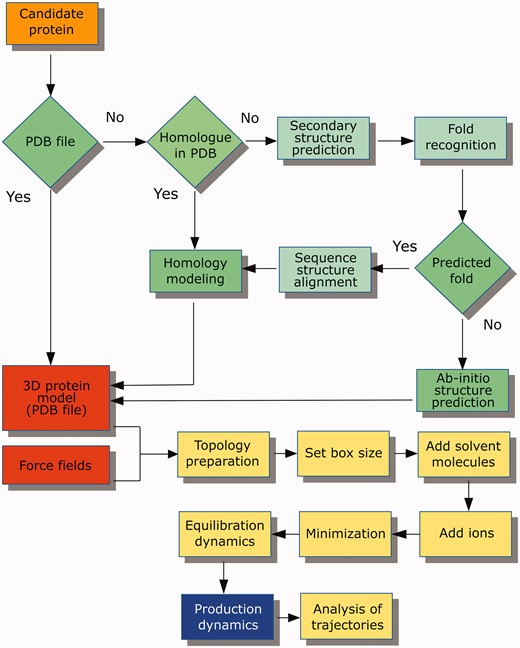

# MD protocol

At this point, we should have built our model structure and we need to setup our MD protocol.

The MD part of the tutorial will be be conducted in this Google Colab environment. A Colab notebook is an online platform provided by Google for creating and running interactive Python code. It's a cloud-based service that allows you to write, run, and share code in a collaborative environment.

* **Connect to a Runtime**:
  If you're using Colab for the first time in a session, you may need to connect to a runtime. You'll see a button that says "Connect" in the top-right corner of the page. Click it to establish a connection.

* **Run Your Code**:
  To run a code cell, click the "Play" button (a triangular button) located on the left side of the cell. Alternatively, you can press Shift+Enter on your keyboard.

* **View Output**:
  After running a code cell, the output or result will be displayed immediately below the cell.

Noteworthy, you have the option to download and execute it locally if you have access to a workstation equipped with a GPU.












In [ ]:
#@title Check if Google Colab has correctly allocated GPU nodes
#@markdown In fact, results of an MD study strictly depend on the used software package, whose overall calculation time is bound, in turn, to the type of system under examination as well as to the available computing hardware.

#@markdown Speaking of computing hardware, graphic processing units (GPU) attracted increasing attention in the past few years because they are cheap, if compared to multi-core devices, and exhibit high performance. This is because GPUs have a highly parallel internal architecture. A review that can help configure a MD workstation equipped with low-cost GPUs can be found at https://doi.org/10.1177%2F1176934319850144.







!nvidia-smi

Mon Oct 30 09:03:36 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 525.105.17   Driver Version: 525.105.17   CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   50C    P8    10W /  70W |      0MiB / 15360MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

**Setting the environment for our calculations**

To begin, our initial step is to install all the essential libraries and packages required for our simulation. The primary packages that we'll be installing include::

1.    Anaconda (https://docs.conda.io/en/latest/miniconda.html) - Package manager and environment for Python.
2.    OpenMM (https://openmm.org/) - Molecular dynamics simulation library.
3.    PyTraj (https://amber-md.github.io/pytraj/latest/index.html) - Trajectory analysis for molecular dynamics.
4.    py3Dmol (https://pypi.org/project/py3Dmol/) - 3D molecular visualization in Python.
5.    Numpy (https://numpy.org/) - Numerical Python library.
6.    Matplotlib (https://matplotlib.org/) - Data visualization library in Python.
7.    AmberTools (https://ambermd.org/AmberTools.php) - Tools for molecular dynamics simulations.

In [1]:
#@title **Install Conda Colab**
#@markdown It may show you an error message - don't worry.
%%capture
import locale
def getpreferredencoding(do_setlocale = True):
    return "UTF-8"
locale.getpreferredencoding = getpreferredencoding
!apt-get install gromacs
!pip install -q condacolab
import condacolab
condacolab.install()
import os
##potrebbe non servire questa prima parte


print("installing hhsuite and amber...")
os.system(f"mamba install -y -q -c conda-forge -c bioconda kalign2=2.04 hhsuite=3.3.0 openmm=7.7.0 pdbfixer 2>&1 1>/dev/null")
os.system("touch HH_READY")
os.system("touch AMBER_READY")
os.system("pip install py3Dmol")
print("installing AmberTools...")
os.system("pip install --upgrade MDAnalysis")
os.system("pip install biopandas")
os.system("mamba install -c conda-forge ambertools --yes")

# **System parametrization, minimization and equilibration**

Let's start uploading our structure to Google Colab: click on the folder icon on the left, and then select the upload icon to upload our previously generated PDB file. You will see the pdb file appearing in the list of files on the left.

*If you experienced any issue building your SUFU-GLI3 model, you can retrieve a ready-to-use pdb from [HERE](https://drive.google.com/file/d/17RvLco_nEdTZV18GeCMYsv9CfC2eRfnl/view?usp=sharing).

*WARNING: the file name must be start_wt_sufu.pdb


## Creating a simulation box

Once we have the structure of our protein target, we can generate the files needed to run the MD simulations. In detail, we need a **topology**, that is a static description of all atoms and interactions in the system, with the definition of the potential energy function that govern the behavior of the system.

This energy function is called “force field”. A **force field** is defined by a mathematical expression that describes the structural properties and vibrational spectra of a system. Force fields are empirical, obtained by parameterizing the potential functions from abinitio or semiempirical quantum mechanical calculations or by experimental data. Force-fields are complex equations, but they are easy to calculate. All the interactions are between pair particles and they are divided in bonded interaction and the non-bonded interactions: springs for bond length and angles, periodic functions for bond rotations and Coulomb's law for van der Waals and electrostatic interactions. The simplicity of these parameters assures that energy and force calculations are extremely fast even for large systems.

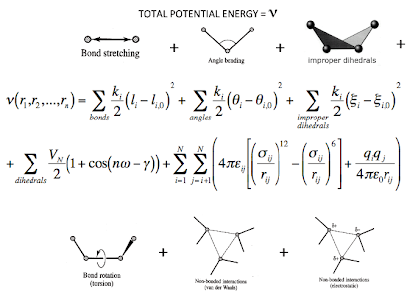

Once you have defined the force field acting on atoms, the next step is that of creating a virtual box, called **simulation box**, containing the molecule of interest and filled with water and ions, inserted at a specified concentration, with the aim to mimic the total charge of the environment and, eventually, to neutralize it.



---


---


Hence, in this tutorial, we will explore the process of generating a topology using the [LEaP program](https://ambermd.org/tutorials/pengfei/index.php). LEaP serves as a bridge between various chemical structure file formats (primarily .pdb and .mol2) and Amber's model parameter file types, including .lib, .prepi, parm.dat, and .frcmod. These parameter files each contain essential information required for building simulations, whether they are for energy minimization or molecular dynamics.

We can generate different topologies according to a series of different:

*   Force_field types (ff19SB and ff14SB)
*   Water model types (TIP3P and OPC)
*   Size box in Ångström (Å)
*   Ions type and concentration

In this case, we will choose default parameters, but you can play with them and see what happens.


In [1]:
#@title **Let's setup our simulation box:**

import sys
from biopandas.pdb import PandasPdb
import os
import urllib.request
import MDAnalysis as mda
import pytraj as pt
import platform
import scipy.cluster.hierarchy
from scipy.spatial.distance import squareform
import scipy.stats as stats
import matplotlib.pyplot as plt
import pandas as pd
from scipy.interpolate import griddata
import seaborn as sb
from statistics import mean, stdev
from pytraj import matrix
from matplotlib import colors
from IPython.display import set_matplotlib_formats

#Google_Drive_Path = '/content/drive/MyDrive' #@param {type:"string"}
workDir = "/content"

pdb_filename = "start_wt_sufu.pdb"

starting = os.path.join(workDir, "starting.pdb")
starting_end = os.path.join(workDir, "starting2.pdb")
tleap = os.path.join(workDir, "tleap.in")
top_nw = os.path.join(workDir, "SYS_nw.prmtop")
crd_nw = os.path.join(workDir, "SYS_nw.crd")
pdb_nw = os.path.join(workDir, "SYS_nw.pdb")
top = os.path.join(workDir, "SYS.prmtop")
crd = os.path.join(workDir, "SYS.crd")
pdb = os.path.join(workDir, "SYS.pdb")

pdbfn = pdb_filename
ppdb = PandasPdb().read_pdb(pdbfn)
ppdb.df['ATOM'] = ppdb.df['ATOM']
ppdb.df['HETATM'] = ppdb.df['HETATM'][ppdb.df['HETATM']['residue_name'] == 'HOH']
ppdb.df['ATOM'] = ppdb.df['ATOM'][ppdb.df['ATOM']['atom_name'] != 'OXT']
ppdb.df['ATOM']= ppdb.df['ATOM'][ppdb.df['ATOM']['element_symbol'] != 'H']
ppdb.to_pdb(path=starting, records=['ATOM', 'HETATM'], gz=False, append_newline=True)

pdb4amber_cmd = "pdb4amber -i " + str(starting) + " -o " + str(starting_end) + " -p"
original_stdout = sys.stdout # Save a reference to the original standard output

with open('pdb4amber.sh', 'w') as f:
    sys.stdout = f # Change the standard output to the file we created.
    print(pdb4amber_cmd)
    sys.stdout = original_stdout # Reset the standard output to its original value

os.system("chmod 700 pdb4amber.sh")
os.system("./pdb4amber.sh")

Force_field = "ff19SB" #@param ["ff19SB", "ff14SB"]
if Force_field == "ff19SB":
  ff = "leaprc.protein.ff19SB"
else:
  ff = "leaprc.protein.ff14SB"

Water_type = "TIP3P" #@param ["TIP3P", "OPC"]
if Water_type == "TIP3P":
  water = "leaprc.water.tip3p"
  water_box = "TIP3PBOX"
else:
  water = "leaprc.water.opc"
  water_box = "OPCBOX"

Size_box = 12 #@param {type:"slider", min:10, max:20, step:1}
size_box = Size_box

#@markdown **ATTENTION**: Give the concentration in Molar units, AMBER tleap will neutralize your system automatically:

Ions = "NaCl" #@param ["NaCl", "KCl" ]

Concentration = "0.15" #@param {type:"string"}

#@markdown ---

f = open(tleap, "w")
f.write("""source """ + str(ff) + "\n"
"""source leaprc.DNA.OL15
source leaprc.RNA.OL3
source leaprc.GLYCAM_06j-1
source leaprc.gaff2
source """  + str(water) + "\n"
"""SYS = loadpdb """  + str(starting_end) + "\n"
"""alignaxes SYS
savepdb SYS """ + str(pdb_nw) + "\n"
"""saveamberparm SYS """ + str(top_nw) + " " + str(crd_nw) + "\n"
"""solvatebox SYS """ + str(water_box) + " " + str(size_box) +  """ 0.7
saveamberparm SYS """ + str(top) + " " + str(crd) + "\n"
"""savepdb SYS """ + str(pdb) + "\n"
"""quit""")
f.close()

tleap_command = "tleap -f " + str(tleap)

original_stdout = sys.stdout # Save a reference to the original standard output

with open('run_tleap.sh', 'w') as f:
    sys.stdout = f # Change the standard output to the file we created.
    print(tleap_command)
    sys.stdout = original_stdout # Reset the standard output to its original value

SYS = os.path.join(workDir, "SYS*")
rm_sys = "rm " + SYS

original_stdout = sys.stdout # Save a reference to the original standard output

with open('rm_sys.sh', 'w') as f:
    sys.stdout = f # Change the standard output to the file we created.
    print(rm_sys)
    sys.stdout = original_stdout # Reset the standard output to its original value

os.system("chmod 700 rm_sys.sh")
os.system("./rm_sys.sh")

os.system("chmod 700 run_tleap.sh")
os.system("./run_tleap.sh")

os.system("grep 'Volume:' leap.log > temp.txt")
with open("temp.txt", 'r') as f:
  for line in f:
        vol = float(line.split()[1])

vol_lit  = vol * pow(10, -27)
atom_lit = 9.03 * pow(10, 22)
conc = float(Concentration)
num_ion = int(vol_lit * (conc/0.15) * atom_lit)

if Ions == "NaCl":
  pos_neut = "Na+ 0"
  pos_num = "Na+ " + str(num_ion)
  Cl_num = num_ion
else:
  pos_neut = "K+ 0"
  pos_num = "K+ " + str(num_ion)
  Cl_num = num_ion

f = open(tleap, "w")
f.write("""source """ + str(ff) + "\n"
"""source leaprc.DNA.OL15
source leaprc.RNA.OL3
source leaprc.GLYCAM_06j-1
source leaprc.gaff2
source """  + str(water) + "\n"
"""SYS = loadpdb """  + str(starting_end) + "\n"
"""alignaxes SYS
check SYS
charge SYS
addions SYS """ + str(pos_neut) + "\n"
"""addions SYS Cl- 0
check SYS
charge SYS
savepdb SYS """ + str(pdb_nw) + "\n"
"""saveamberparm SYS """ + str(top_nw) + " " + str(crd_nw) + "\n"
"""solvatebox SYS """ + str(water_box) + " " + str(size_box) +  """ 0.7 """ + "\n"
"""addIonsRand SYS """ + str(pos_num) + """ Cl- """ + str(Cl_num) + "\n"
"""saveamberparm SYS """ + str(top) + " " + str(crd) + "\n"
"""savepdb SYS """ + str(pdb) + "\n"
"""quit""")
f.close()

os.system("chmod 700 run_tleap.sh")
os.system("./run_tleap.sh")

os.system("rm *.sh temp.txt")

pdb_amber = os.path.exists(pdb)
top_amber = os.path.exists(top)
crd_amber = os.path.exists(crd)

if pdb_amber == True and top_amber == True and crd_amber == True:
  print("Successfully generated topology! :-)")
else:
  print("ERROR: Check your input file! ")

Successfully generated topology! :-)


In [ ]:
#@title **Now, let's examine our simulation box:**
import warnings
warnings.filterwarnings('ignore')
import py3Dmol

color = "gray" #@param ["gray", "rainbow"]
show_sidechains = False #@param {type:"boolean"}
show_mainchains = False #@param {type:"boolean"}
show_box = True #@param {type:"boolean"}
box_opacity = 0.6 #@param {type:"slider", min:0, max:1, step:0.1}


def show_pdb(show_sidechains=False, show_mainchains=False, show_box = False, color="rainbow"):
  view = py3Dmol.view(js='https://3dmol.org/build/3Dmol.js',)
  view.addModel(open(pdb,'r').read(),'pdb')

  if color == "gray":
    view.setStyle({'cartoon':{}})
  elif color == "rainbow":
    view.setStyle({'cartoon': {'color':'spectrum'}})

  if show_sidechains:
    BB = ['C','O','N']
    view.addStyle({'and':[{'resn':["GLY","PRO"],'invert':True},{'atom':BB,'invert':True}]},
                        {'stick':{'colorscheme':f"WhiteCarbon",'radius':0.3}})
    view.addStyle({'and':[{'resn':"GLY"},{'atom':'CA'}]},
                        {'sphere':{'colorscheme':f"WhiteCarbon",'radius':0.3}})
    view.addStyle({'and':[{'resn':"PRO"},{'atom':['C','O'],'invert':True}]},
                        {'stick':{'colorscheme':f"WhiteCarbon",'radius':0.3}})
  if show_mainchains:
    BB = ['C','O','N','CA']
    view.addStyle({'atom':BB},{'stick':{'colorscheme':f"WhiteCarbon",'radius':0.3}})

  if show_box:
    view.addSurface(py3Dmol.SAS, {'opacity': box_opacity, 'color':'white'})

  view.zoomTo()
  return view


show_pdb(show_sidechains, show_mainchains, show_box, color).show()

You appear to be running in JupyterLab (or JavaScript failed to load for some other reason). You need to install the 3dmol extension: 
 jupyter labextension install jupyterlab_3dmol

---
---
# Why do we need to minimize and equilibrate our system?

A minimization step is required to find an arrangement of the atoms in space that guarantees that the net interatomic forces acting on each particle are as close to zero as possible. The actual aim of this step is to find the closest local, and not global, minimum energy configuration. To reach a minimum, the system must undergo several iteration cycles, in the order of thousands, where coordinates of atoms are iteratively updated until convergence. Hence, each iteration is also known as a minimization step.


In [2]:
#@title Let's minimize the structure

import simtk.openmm as mm
from simtk.openmm import *
from simtk.openmm.app import *
from simtk.unit import *
import pytraj as pt

from sys import stdout, exit, stderr
import os, math, fnmatch

Jobname = 'SUFU_GLI3_equil' #@param {type:"string"}

Minimization_steps = "10000" #@param ["1000", "5000", "10000", "20000", "50000", "100000"]

#############################################
# Defining functions to use below:
def backup_old_log(pattern, string):
	result = []
	for root, dirs, files in os.walk("./"):
		for name in files:
			if fnmatch.fnmatch(name, pattern):

				try:
					number = int(name[-2])
					avail = isinstance(number, int)
					#print(name,avail)
					if avail == True:
						result.append(number)
				except:
					pass

	if len(result) > 0:
		maxnumber = max(result)
	else:
		maxnumber = 0

	backup_file = "\#" + string + "." + str(maxnumber + 1) + "#"
	os.system("mv " + string + " " + backup_file)
	return backup_file

def restraints(system, crd, fc, restraint_array):

	boxlx = system.getDefaultPeriodicBoxVectors()[0][0].value_in_unit(nanometers)
	boxly = system.getDefaultPeriodicBoxVectors()[1][1].value_in_unit(nanometers)
	boxlz = system.getDefaultPeriodicBoxVectors()[2][2].value_in_unit(nanometers)

	if fc > 0:
		# positional restraints for all heavy-atoms
		posresPROT = CustomExternalForce('k*periodicdistance(x, y, z, x0, y0, z0)^2;')
		posresPROT.addPerParticleParameter('k')
		posresPROT.addPerParticleParameter('x0')
		posresPROT.addPerParticleParameter('y0')
		posresPROT.addPerParticleParameter('z0')

		for atom1 in restraint_array:
			atom1 = int(atom1)

			xpos  = crd.positions[atom1].value_in_unit(nanometers)[0]
			ypos  = crd.positions[atom1].value_in_unit(nanometers)[1]
			zpos  = crd.positions[atom1].value_in_unit(nanometers)[2]

			posresPROT.addParticle(atom1, [fc, xpos, ypos, zpos])

		system.addForce(posresPROT)

	return system
##############################################

print("\t- Reading topology and structure file...")
jobname = os.path.join(workDir, Jobname)
coordinatefile = os.path.join(workDir, "SYS.crd")
pdbfile = os.path.join(workDir, "SYS.pdb")
topologyfile = os.path.join(workDir, "SYS.prmtop")

prmtop = AmberPrmtopFile(topologyfile)
inpcrd = AmberInpcrdFile(coordinatefile)

print("\t- Creating system and setting parameters...")
nonbondedMethod = PME
nonbondedCutoff = 1.0*nanometers
ewaldErrorTolerance = 0.0005
constraints = HBonds
rigidWater = True
constraintTolerance = 0.000001
friction = 1.0
system = prmtop.createSystem(nonbondedMethod=nonbondedMethod, nonbondedCutoff=nonbondedCutoff,
                           constraints=constraints, rigidWater=rigidWater, ewaldErrorTolerance=ewaldErrorTolerance)

temperature = float(298)*kelvin
dt=0.002
print("\t- Setting integrator...")
integrator = LangevinIntegrator(temperature, friction, dt)
integrator.setConstraintTolerance(constraintTolerance)
simulation = Simulation(prmtop.topology, system, integrator)
simulation.context.setPositions(inpcrd.positions)
if inpcrd.boxVectors is not None:
    simulation.context.setPeriodicBoxVectors(*inpcrd.boxVectors)

print("\t- Energy minimization: " + str(Minimization_steps) + " steps")
print("\t-> Potential Energy before minimization = " + str(simulation.context.getState(getEnergy=True).getPotentialEnergy()))
simulation.minimizeEnergy(tolerance=10*kilojoule/mole, maxIterations=int(Minimization_steps))
print("\t-> Potential Energy after minimization = " + str(simulation.context.getState(getEnergy=True).getPotentialEnergy()))


	- Reading topology and structure file...
	- Creating system and setting parameters...
	- Setting integrator...
	- Energy minimization: 10000 steps
	-> Potential Energy before minimization = -390891.4867386678 kJ/mol
	-> Potential Energy after minimization = -951856.9867386678 kJ/mol


Now, we need to equilibrate our system. In the equilibration phase of molecular dynamics (MD), the concepts of temperature, pressure, and simulation time play crucial roles in ensuring that the system reaches a stable and realistic state for subsequent simulations. Let's expand on these concepts:

* Temperature: in the context of MD simulations, represents the average kinetic energy of particles in the system. During equilibration, setting an appropriate temperature is vital. It allows the system to reach a state where the thermal energy is distributed consistently across all particles. This is important to simulate a system at a specific temperature, which can represent experimental conditions or physiological settings. Temperature can be adjusted using various algorithms, such as the Berendsen thermostat or the Andersen thermostat, to control the rate of energy exchange between the system and its surroundings.

* Pressure: in MD simulations refers to the force exerted on the system's boundaries due to molecular collisions. Maintaining the correct pressure ensures that the system's volume remains constant, mimicking conditions similar to experiments where pressure is a crucial factor. Various methods like the Berendsen barostat or the Parrinello-Rahman barostat are employed to control and equilibrate pressure during MD simulations.

* Simulation Time: it represents the duration for which the MD simulation runs. It is expressed in terms of the number of time steps, with each time step typically covering a femtosecond or shorter timescale. It's important to run the simulation for an adequate duration.

Equilibration time varies depending on the complexity of the system, and it's often a balance between computational resources and the need for reliable results. Finally, we will define the force constant used to restraint protein heavy-atoms in place and the frequency at which we want to save atomic coordinates in a trajectory file.

In [3]:
#@title ### Parameters for Equilibration protocol:

# remove whitespaces

#@markdown Temperature (in Kelvin) and Pressure (in bar)
Temperature = 298 #@param {type:"string"}
temperature_eq = Temperature
Pressure = "1" #@param {type:"string"}
pressure_eq = Pressure

#@markdown Position restraints force constant (in kJ/mol):
Force_constant = 500 #@param {type:"slider", min:0, max:2000, step:100}

#@markdown Simulation time (in nanoseconds) and integration time (in femtoseconds):
Time = "1" #@param {type:"string"}
stride_time_eq = Time
Integration_timestep = "2" #@param ["0.5", "1", "2", "3", "4"]
dt_eq = Integration_timestep


Write_the_trajectory = "10"
write_the_trajectory_eq = Write_the_trajectory
Write_the_log = "10"
write_the_log_eq = Write_the_log

#############################################
# Defining MD simulation parameters

time_ps = float(Time)*1000
simulation_time = float(time_ps)*picosecond		# in ps
dt = int(dt_eq)*femtosecond
temperature = float(temperature_eq)*kelvin
savcrd_freq = int(write_the_trajectory_eq)*picosecond
print_freq  = int(write_the_log_eq)*picosecond

pressure	= float(pressure_eq)*bar

restraint_fc = int(Force_constant) # kJ/mol

nsteps  = int(simulation_time.value_in_unit(picosecond)/dt.value_in_unit(picosecond))
nprint  = int(print_freq.value_in_unit(picosecond)/dt.value_in_unit(picosecond))
nsavcrd = int(savcrd_freq.value_in_unit(picosecond)/dt.value_in_unit(picosecond))



#############################################
print("\n> Simulation details:\n")
print("\tJob name = " + jobname)
print("\tCoordinate file = " + str(coordinatefile))
print("\tPDB file = " + str(pdbfile))
print("\tTopology file = " + str(topologyfile))

print("\n\tSimulation_time = " + str(simulation_time))
print("\tIntegration timestep = " + str(dt))
print("\tTotal number of steps = " +  str(nsteps))

print("\n\tSave coordinates each " + str(savcrd_freq))
print("\tPrint in log file each " + str(print_freq))

print("\n\tTemperature = " + str(temperature))
print("\tPressure = " + str(pressure))
#############################################


print("\t- Applying restraints. Force Constant = " + str(Force_constant) + "kJ/mol")
pt_system = pt.iterload(coordinatefile, topologyfile)
pt_topology = pt_system.top
restraint_array = pt.select_atoms('!(:H*) & !(:WAT) & !(:Na+) & !(:Cl-) & !(:Mg+) & !(:K+)', pt_topology)

system = restraints(system, inpcrd, restraint_fc, restraint_array)

print("\t- Setting barostat...")
system.addForce(MonteCarloBarostat(pressure, temperature))

simulation.context.setVelocitiesToTemperature(temperature)

dcd_file = jobname + ".dcd"
log_file = jobname + ".log"
rst_file = jobname + ".rst"
prv_rst_file = jobname + ".rst"
pdb_file = jobname + ".pdb"

# Creating a trajectory file and reporters
dcd = DCDReporter(dcd_file, nsavcrd)
firstdcdstep = (nsteps) + nsavcrd
dcd._dcd = DCDFile(dcd._out, simulation.topology, simulation.integrator.getStepSize(), firstdcdstep, nsavcrd) # charmm doesn't like first step to be 0

simulation.reporters.append(dcd)
simulation.reporters.append(StateDataReporter(stdout, nprint, step=True, speed=True, progress=True, totalSteps=nsteps, remainingTime=True, separator='\t\t'))
simulation.reporters.append(StateDataReporter(log_file, nprint, step=True, kineticEnergy=True, potentialEnergy=True, totalEnergy=True, temperature=True, volume=True, density=True,speed=True))




> Simulation details:

	Job name = /content/SUFU_GLI3_equil
	Coordinate file = /content/SYS.crd
	PDB file = /content/SYS.pdb
	Topology file = /content/SYS.prmtop

	Simulation_time = 1000.0 ps
	Integration timestep = 2 fs
	Total number of steps = 500000

	Save coordinates each 10 ps
	Print in log file each 10 ps

	Temperature = 298.0 K
	Pressure = 1.0 bar
	- Applying restraints. Force Constant = 500kJ/mol
	- Setting barostat...


In [4]:
#@title Runs an Equilibration MD simulation (NPT ensemble)
#@markdown Now, let's equilibrate our system!
print("\t- Setting initial velocities...")
simulation.context.setVelocitiesToTemperature(temperature)

#############################################
# Running Equilibration on NPT ensemble

dcd_file = jobname + ".dcd"
log_file = jobname + ".log"
rst_file = jobname + ".rst"
prv_rst_file = jobname + ".rst"
pdb_file = jobname + ".pdb"

# Creating a trajectory file and reporters
dcd = DCDReporter(dcd_file, nsavcrd)
firstdcdstep = (nsteps) + nsavcrd
dcd._dcd = DCDFile(dcd._out, simulation.topology, simulation.integrator.getStepSize(), firstdcdstep, nsavcrd) # charmm doesn't like first step to be 0

simulation.reporters.append(dcd)
simulation.reporters.append(StateDataReporter(stdout, nprint, step=True, speed=True, progress=True, totalSteps=nsteps, remainingTime=True, separator='\t\t'))
simulation.reporters.append(StateDataReporter(log_file, nprint, step=True, kineticEnergy=True, potentialEnergy=True, totalEnergy=True, temperature=True, volume=True, speed=True))

print("\n> Simulating " + str(nsteps) + " steps...")
simulation.step(nsteps)

simulation.reporters.clear() # remove all reporters so the next iteration don't trigger them.


##################################
# Writing last frame information of stride
print("\n> Writing state file (" + str(rst_file) + ")...")
state = simulation.context.getState( getPositions=True, getVelocities=True )
with open(rst_file, 'w') as f:
	f.write(XmlSerializer.serialize(state))

last_frame = int(nsteps/nsavcrd)
print("> Writing coordinate file (" + str(pdb_file) + ", frame = " + str(last_frame) + ")...")
positions = simulation.context.getState(getPositions=True).getPositions()
PDBFile.writeFile(simulation.topology, positions, open(pdb_file, 'w'))

print("\n> Finished!\n")

	- Setting initial velocities...

> Simulating 500000 steps...
#"Progress (%)"		"Step"		"Speed (ns/day)"		"Time Remaining"
1.0%		5000		0		--
#"Progress (%)"		"Step"		"Speed (ns/day)"		"Time Remaining"
1.0%		5000		0		--
2.0%		10000		83.9		16:48
2.0%		10000		92.6		15:14
3.0%		15000		89.9		15:32
3.0%		15000		94.6		14:45
4.0%		20000		95		14:33
4.0%		20000		98.4		14:02
5.0%		25000		94.9		14:25
5.0%		25000		97.4		14:02
6.0%		30000		96.3		14:02
6.0%		30000		98.5		13:44
7.0%		35000		97.2		13:46
7.0%		35000		99		13:31
8.0%		40000		96.5		13:44
8.0%		40000		98		13:31
9.0%		45000		97.1		13:29
9.0%		45000		98.4		13:18
10.0%		50000		96.4		13:26
10.0%		50000		97.6		13:17
11.0%		55000		96.8		13:14
11.0%		55000		97.8		13:06
12.0%		60000		96.1		13:11
12.0%		60000		97		13:03
13.0%		65000		95.8		13:04
13.0%		65000		96.7		12:57
14.0%		70000		95.8		12:55
14.0%		70000		96.5		12:49
15.0%		75000		95.6		12:47
15.0%		75000		96.4		12:42
16.0%		80000		95.7		12:38
16.0%		80000		96.4		12:32
17.0%		85000		95.6		12:29

Index(['Potential Energy (kJ/mole)', 'Kinetic Energy (kJ/mole)',
       'Total Energy (kJ/mole)', 'Temperature (K)', 'Box Volume (nm^3)',
       'Speed (ns/day)'],
      dtype='object')


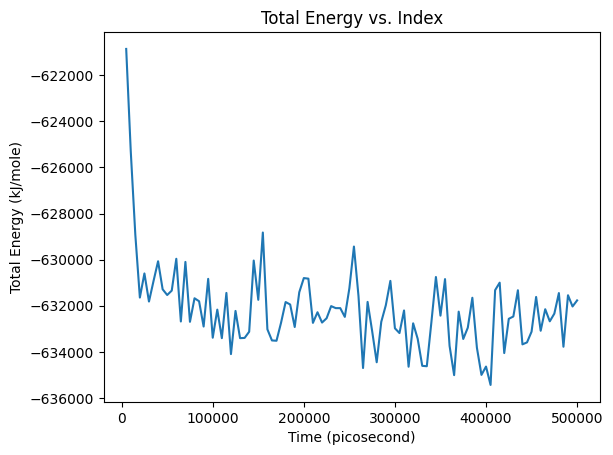

In [5]:
#@title ### Check the equilibration convergence:

max=int(Time)*100
equilib_log = pd.read_csv("SUFU_GLI3_equil.log", on_bad_lines='skip',index_col=0).iloc[:max]
equilib_log=equilib_log.sort_index()
print(equilib_log.columns)
equilib_log['Total Energy (kJ/mole)'].plot()
# You can add labels and title for the plot
plt.xlabel('Time (picosecond)')
plt.ylabel('Total Energy (kJ/mole)')
plt.title('Total Energy vs. Index')

# Show the plot
plt.show()

---
---
# Running a Production MD simulation

Finally, we will proceed with the Production simulation itself using the equilibrated system coordinates as input structure.

Note that we will use here a *.rst state file* , which contains atomic velocities and positions from the last frame of the equilibration simulation, guaranteeing that our production simulation begins from a thermodynamically equilibrated system.




In [6]:
#@title Parameters for MD Production protocol:
#

Equilibrated_PDB = 'SUFU_GLI3_equil.pdb'
State_file = 'SUFU_GLI3_equil.rst'


# remove whitespaces
Jobname = 'SUFU_GLI3_prod' #@param {type:"string"}

#@markdown Simulation time (in nanoseconds), number of strides (integers) and integration timestep (in femtoseconds):
Stride_Time = "1"
stride_time_prod = Stride_Time
Number_of_strides = "1"
nstride = Number_of_strides
Integration_timestep = "2" #@param ["0.5", "1", "2", "3", "4"]
dt_prod = Integration_timestep

#@markdown Temperature (in Kelvin) and Pressure (in bar)
Temperature = 298 #@param {type:"string"}
temperature_prod = Temperature
Pressure = 1 #@param {type:"string"}
pressure_prod = Pressure

#@markdown Frequency to write the trajectory file (in picoseconds):
Write_the_trajectory = "10" #@param ["10", "100", "200", "500", "1000"]
write_the_trajectory_prod = Write_the_trajectory

#@markdown Frequency to write the log file (in picoseconds):
Write_the_log = "10" #@param ["10", "100", "200", "500", "1000"]
write_the_log_prod = Write_the_log

#@markdown ---

In [7]:
#@title Runs a Production MD simulation
###########################################
import simtk.openmm as mm
from simtk.openmm import *
from simtk.openmm.app import *
from simtk.unit import *

from sys import stdout, exit, stderr
import os, math, fnmatch

#############################################
# Defining MD simulation parameters

jobname = os.path.join(workDir, str(Jobname))
coordinatefile = os.path.join(workDir, "SYS.crd")
pdbfile = os.path.join(workDir, Equilibrated_PDB)
topologyfile = os.path.join(workDir, "SYS.prmtop")
equil_rst_file = os.path.join(workDir, State_file)


stride_time_ps = float(stride_time_prod)*1000
stride_time = float(stride_time_ps)*picosecond
nstride = int(Number_of_strides)
dt = int(dt_prod)*femtosecond
temperature = float(temperature_prod)*kelvin
savcrd_freq = int(write_the_trajectory_prod)*picosecond
print_freq  = int(write_the_log_prod)*picosecond

pressure	= float(pressure_prod)*bar

simulation_time = stride_time*nstride
nsteps  = int(stride_time.value_in_unit(picosecond)/dt.value_in_unit(picosecond))
nprint  = int(print_freq.value_in_unit(picosecond)/dt.value_in_unit(picosecond))
nsavcrd = int(savcrd_freq.value_in_unit(picosecond)/dt.value_in_unit(picosecond))
firststride = 1 # must be integer
#############################################
# Defining functions to use below:
def backup_old_log(pattern, string):
	result = []
	for root, dirs, files in os.walk("./"):
		for name in files:
			if fnmatch.fnmatch(name, pattern):

				try:
					number = int(name[-2])
					avail = isinstance(number, int)
					#print(name,avail)
					if avail == True:
						result.append(number)
				except:
					pass

	if len(result) > 0:
		maxnumber = max(result)
	else:
		maxnumber = 0

	backup_file = "\#" + string + "." + str(maxnumber + 1) + "#"
	os.system("mv " + string + " " + backup_file)
	return backup_file
##############################################

#############################################
print("\n> Simulation details:\n")
print("\tJob name = " + jobname)
print("\tCoordinate file = " + str(coordinatefile))
print("\tPDB file = " + str(pdbfile))
print("\tTopology file = " + str(topologyfile))

print("\n\tSimulation_time = " + str(stride_time*nstride))
print("\tIntegration timestep = " + str(dt))
print("\tTotal number of steps = " +  str(nsteps*nstride))
print("\tNumber of strides = " + str(nstride) + " (" + str(stride_time) + " in each stride)")

print("\n\tSave coordinates each " + str(savcrd_freq))
print("\tPrint in log file each " + str(print_freq))

print("\n\tTemperature = " + str(temperature))
print("\tPressure = " + str(pressure))
#############################################

print("\n> Setting the system:\n")

print("\t- Reading topology and structure file...")
prmtop = AmberPrmtopFile(topologyfile)
inpcrd = AmberInpcrdFile(coordinatefile)


print("\t- Creating system and setting parameters...")
nonbondedMethod = PME
nonbondedCutoff = 1.0*nanometers
ewaldErrorTolerance = 0.0005
constraints = HBonds
rigidWater = True
constraintTolerance = 0.000001
friction = 1.0
system = prmtop.createSystem(nonbondedMethod=nonbondedMethod, nonbondedCutoff=nonbondedCutoff,
                           constraints=constraints, rigidWater=rigidWater, ewaldErrorTolerance=ewaldErrorTolerance)

print("\t- Setting barostat...")
system.addForce(MonteCarloBarostat(pressure, temperature))

print("\t- Setting integrator...")
integrator = LangevinIntegrator(temperature, friction, dt)
integrator.setConstraintTolerance(constraintTolerance)
simulation = Simulation(prmtop.topology, system, integrator)
simulation.context.setPositions(inpcrd.positions)
if inpcrd.boxVectors is not None:
	simulation.context.setPeriodicBoxVectors(*inpcrd.boxVectors)

#############################################
# Opening a loop of extension NSTRIDE to simulate the entire STRIDE_TIME*NSTRIDE
for n in range(1, nstride + 1):

	print("\n\n>>> Simulating Stride #" + str(n) + " <<<")

	dcd_file = jobname + "_" + str(n) + ".dcd"
	log_file = jobname + "_" + str(n) + ".log"
	rst_file = jobname + "_" + str(n) + ".rst"
	prv_rst_file = jobname + "_" + str(n-1) + ".rst"
	pdb_file = jobname + "_" + str(n) + ".pdb"

	if os.path.exists(rst_file):
		print("> Stride #" + str(n) + " finished (" + rst_file + " present). Moving to next stride... <")
		continue

	if n == 1:
		print("\n> Loading previous state from equilibration > " + equil_rst_file + " <")
		with open(equil_rst_file, 'r') as f:
			simulation.context.setState(XmlSerializer.deserialize(f.read()))
			currstep = int((n-1)*nsteps)
			currtime = currstep*dt.in_units_of(picosecond)
			simulation.currentStep = currstep
			simulation.context.setTime(currtime)
			print("> Current time: " + str(currtime) + " (Step = " + str(currstep) + ")")

	else:
		print("> Loading previous state from > " + prv_rst_file + " <")
		with open(prv_rst_file, 'r') as f:
			simulation.context.setState(XmlSerializer.deserialize(f.read()))
			currstep = int((n-1)*nsteps)
			currtime = currstep*dt.in_units_of(picosecond)
			simulation.currentStep = currstep
			simulation.context.setTime(currtime)
			print("> Current time: " + str(currtime) + " (Step = " + str(currstep) + ")")


	dcd = DCDReporter(dcd_file, nsavcrd)
	firstdcdstep = (currstep) + nsavcrd
	dcd._dcd = DCDFile(dcd._out, simulation.topology, simulation.integrator.getStepSize(), firstdcdstep, nsavcrd) # first step should not be 0

	simulation.reporters.append(dcd)
	simulation.reporters.append(StateDataReporter(stdout, nprint, step=True, speed=True, progress=True, totalSteps=(nsteps*nstride), remainingTime=True, separator='\t\t'))
	simulation.reporters.append(StateDataReporter(log_file, nprint, step=True, kineticEnergy=True, potentialEnergy=True, totalEnergy=True, temperature=True, volume=True, speed=True))

	print("\n> Simulating " + str(nsteps) + " steps... (Stride #" + str(n) + ")")
	simulation.step(nsteps)

	simulation.reporters.clear() # remove all reporters so the next iteration don't trigger them.


	##################################
	# Writing last frame information of stride
	print("\n> Writing state file (" + str(rst_file) + ")...")
	state = simulation.context.getState( getPositions=True, getVelocities=True )
	with open(rst_file, 'w') as f:
		f.write(XmlSerializer.serialize(state))

	last_frame = int(nsteps/nsavcrd)
	print("> Writing coordinate file (" + str(pdb_file) + ", frame = " + str(last_frame) + ")...")
	positions = simulation.context.getState(getPositions=True).getPositions()
	PDBFile.writeFile(simulation.topology, positions, open(pdb_file, 'w'))

print("\n> Finished!\n")


> Simulation details:

	Job name = /content/SUFU_GLI3_prod
	Coordinate file = /content/SYS.crd
	PDB file = /content/SUFU_GLI3_equil.pdb
	Topology file = /content/SYS.prmtop

	Simulation_time = 1000.0 ps
	Integration timestep = 2 fs
	Total number of steps = 500000
	Number of strides = 1 (1000.0 ps in each stride)

	Save coordinates each 10 ps
	Print in log file each 10 ps

	Temperature = 298.0 K
	Pressure = 1.0 bar

> Setting the system:

	- Reading topology and structure file...
	- Creating system and setting parameters...
	- Setting barostat...
	- Setting integrator...


>>> Simulating Stride #1 <<<

> Loading previous state from equilibration > /content/SUFU_GLI3_equil.rst <
> Current time: 0.0 ps (Step = 0)

> Simulating 500000 steps... (Stride #1)
#"Progress (%)"		"Step"		"Speed (ns/day)"		"Time Remaining"
1.0%		5000		0		--
2.0%		10000		78.1		18:04
3.0%		15000		84.2		16:34
4.0%		20000		84.5		16:21
5.0%		25000		85.7		15:58
6.0%		30000		85.6		15:48
7.0%		35000		86.1		15:32
8.0%		400

In [8]:
#@title **Concatenate and align the trajectory**
#@markdown **Important**: The **Google Drive Path**, **Jobname**, **Number of strides**, **stride time** and **trajectory saved frequency** should be the same you have been used to run your simulation in the previous steps.

import MDAnalysis as mda
from MDAnalysis.analysis import align, rms

Google_Drive_Path = '/content/'
workDir = Google_Drive_Path
Equilibrated_PDB = 'SUFU_GLI3_equil.pdb' #@param {type:"string"}
Jobname = "SUFU_GLI3_prod" #@param {type: "string"}
Skip = "1"
stride_traj = Skip
Output_format = "xtc" #@param ["dcd", "pdb", "trr", "xtc"]
trajectory_saved_frequency = "10" #@param ["10", "100", "200", "500", "1000"]
traj_save_freq = trajectory_saved_frequency
Remove_waters = "yes" #@param ["yes", "no"]
# stride_id_as_ref_for_alignment = "1" #@param {type: "string"}
first_stride = '1'
nstride=1
output_prefix = first_stride+"-"+str(int(first_stride)+nstride-1)

stride_time_ps = float(1.0)*1000
simulation_time_analysis = stride_time_ps*nstride
simulation_ns = float(1.0)*int(1)
number_frames = int(simulation_time_analysis)/int(traj_save_freq)
number_frames_analysis = number_frames/int(stride_traj)


# traj_end = os.path.join(workDir, str(Jobname) + "_all.dcd")
nw_dcd = os.path.join(workDir, str(Jobname) + output_prefix + "_nw." + str(Output_format))
nw_pdb = os.path.join(workDir, str(Jobname) +  "_nw.pdb")
whole_pdb = os.path.join(workDir, str(Jobname) +  "_whole.pdb")
whole_dcd = os.path.join(workDir, str(Jobname) + output_prefix + "_whole." + str(Output_format))
template =  os.path.join(workDir, str(Jobname) + '_%s.dcd')
pdb = os.path.join(workDir, Equilibrated_PDB)

flist = [template % str(i) for i in range(int(first_stride), int(first_stride) + nstride)]
ref = [template % int(1)]

u1 = mda.Universe(pdb, flist)
u2 = mda.Universe(pdb, ref)

u2.trajectory[0] # set u2 to first frame

# print(rms.rmsd(u1.select_atoms('name CA').positions, u2.select_atoms('name CA').positions, superposition=False))

align.AlignTraj(u1, u2, select='name CA', in_memory=True).run()

nw = u1.select_atoms("not (resname HOH)")
nw = nw.select_atoms("not (resname Na+)")
nw = nw.select_atoms("not (resname Cl-)")


if Remove_waters == "yes":
  with mda.Writer(nw_dcd, nw.n_atoms) as W:
    for ts in u1.trajectory[::int(Skip)]:
        W.write(nw, )
  not_waters = u2.select_atoms("not (resname HOH)")
  not_waters = not_waters.select_atoms("not (resname Na+)")
  not_waters = not_waters.select_atoms("not (resname Cl-)")
  not_waters.write(nw_pdb)
  traj_dcd_check = os.path.exists(nw_dcd)
  traj = nw_dcd
  pdb_ref = nw_pdb
else:
  with mda.Writer(whole_dcd, u1.select_atoms("all").n_atoms) as W:
    for ts in u1.trajectory[::int(Skip)]:
        W.write(u1.select_atoms("all"))
  whole = u2.select_atoms("all")
  whole.write(whole_pdb)
  traj_dcd_check = os.path.exists(whole_dcd)
  traj = whole_dcd
  pdb_ref = whole_pdb

traj_load = pt.load(traj, pdb_ref)
print(traj_load)

if traj_dcd_check == True:
  print("Trajectory concatenated successfully! :-)")
else:
  print("ERROR: Check your inputs! ")



/usr/local/lib/python3.10/site-packages/MDAnalysis/coordinates/DCD.py:165: DeprecationWarning: DCDReader currently makes independent timesteps by copying self.ts while other readers update self.ts inplace. This behavior will be changed in 3.0 to be the same as other readers. Read more at https://github.com/MDAnalysis/mdanalysis/issues/3889 to learn if this change in behavior might affect you.
  warnings.warn("DCDReader currently makes independent timesteps"
/usr/local/lib/python3.10/site-packages/MDAnalysis/coordinates/PDB.py:1151: UserWarning: Found no information for attr: 'formalcharges' Using default value of '0'
  warnings.warn("Found no information for attr: '{}'"


pytraj.Trajectory, 100 frames: 
Size: 0.013020 (GB)
<Topology: 5825 atoms, 376 residues, 2 mols, PBC with box type = orthorhombic>
           
Trajectory concatenated successfully! :-)


In [ ]:
#@title Load, view and check the trajectory
import py3Dmol
import warnings
warnings.filterwarnings('ignore')

#py3dmol functions
class Atom(dict):
  def __init__(self, line):
    self["type"] = line[0:6].strip()
    self["idx"] = line[6:11].strip()
    self["name"] = line[12:16].strip()
    self["resname"] = line[17:20].strip()
    self["resid"] = int(int(line[22:26]))
    self["x"] = float(line[30:38])
    self["y"] = float(line[38:46])
    self["z"] = float(line[46:54])
    self["sym"] = line[76:78].strip()

  def __str__(self):
    line = list(" " * 80)
    line[0:6] = self["type"].ljust(6)
    line[6:11] = self["idx"].ljust(5)
    line[12:16] = self["name"].ljust(4)
    line[17:20] = self["resname"].ljust(3)
    line[22:26] = str(self["resid"]).ljust(4)
    line[30:38] = str(self["x"]).rjust(8)
    line[38:46] = str(self["y"]).rjust(8)
    line[46:54] = str(self["z"]).rjust(8)
    line[76:78] = self["sym"].rjust(2)
    return "".join(line) + "\n"

class Molecule(list):
  def __init__(self, file):
    for line in file:
      if "ATOM" in line or "HETATM" in line:
        self.append(Atom(line))

    def __str__(self):
      outstr = ""
      for at in self:
        outstr += str(at)
      return outstr

if number_frames_analysis > 10:
  stride_animation = number_frames_analysis/10
else:
  stride_animation = 1

u = mda.Universe(pdb_ref, traj)

# Write out frames for animation
protein = u.select_atoms('not (resname WAT)')
i = 0
for ts in u.trajectory[0:len(u.trajectory):int(stride_animation)]:
    if i > -1:
        with mda.Writer('' + str(i) + '.pdb', protein.n_atoms) as W:
            W.write(protein)
    i = i + 1
# Load frames as molecules
molecules = []
for i in range(int(len(u.trajectory)/int(stride_animation))):
    with open('' + str(i) + '.pdb') as ifile:
        molecules.append(Molecule(ifile))

models = ""
for i in range(len(molecules)):
  models += "MODEL " + str(i) + "\n"
  for j,mol in enumerate(molecules[i]):
    models += str(mol)
  models += "ENDMDL\n"
#view.addModelsAsFrames(models)

# Animation
view = py3Dmol.view(width=800, height=600)
view.addModelsAsFrames(models)
for i, at in enumerate(molecules[0]):
    default = {"cartoon": {'color': 'spectrum'}}
    view.setStyle({'model': -1, 'serial': i+1}, at.get("pymol", default))

view.zoomTo()
view.animate({'loop': "forward"})
view.show()

You appear to be running in JupyterLab (or JavaScript failed to load for some other reason). You need to install the 3dmol extension: 
 jupyter labextension install jupyterlab_3dmol

---
---
# Analysis

Although visualizing your trajectory can be quite useful, sometimes you also want more quantitative data.

Analyses of MD trajectories vary a lot and we do not intend to cover it all here. However, one can make use of MDanalysis or PyTraj to easily analyze simulations.

Below, you can find a few examples of code snippets that can help you to shed some light on your simulation behavior.

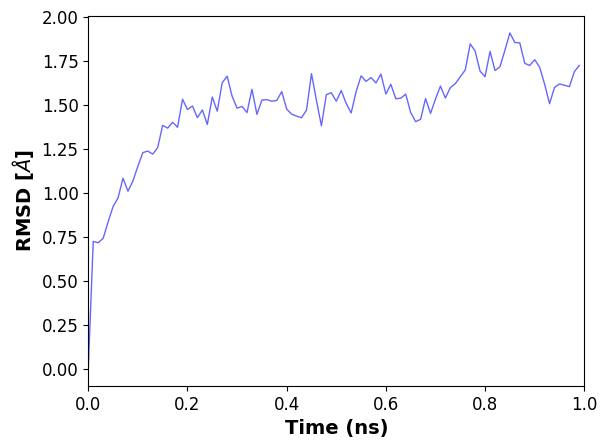

In [9]:
#@title Compute RMSD of protein's CA atoms
#@markdown **Provide output file names below:**
Output_name = 'rmsd_ca' #@param {type:"string"}
import numpy as np

rmsd = pt.rmsd(traj_load, ref = 0, mask = "@CA")

time = len(rmsd)*int(Write_the_trajectory)/1000
time_array = np.arange(0,time,int(Write_the_trajectory)/1000)*int(stride_traj)

# Plotting:
ax = plt.plot(time_array, rmsd, alpha=0.6, color = 'blue', linewidth = 1.0)
plt.xlim(0, simulation_ns)
#plt.ylim(2, 6)

plt.xlabel("Time (ns)", fontsize = 14, fontweight = 'bold')
plt.ylabel("RMSD [$\AA$]", fontsize = 14, fontweight = 'bold')
plt.xticks(fontsize = 12)
plt.yticks(fontsize = 12)
plt.savefig(os.path.join(workDir, Output_name + ".png"), dpi=600, bbox_inches='tight')

raw_data=pd.DataFrame(rmsd)
raw_data.to_csv(os.path.join(workDir, Output_name + ".csv"))

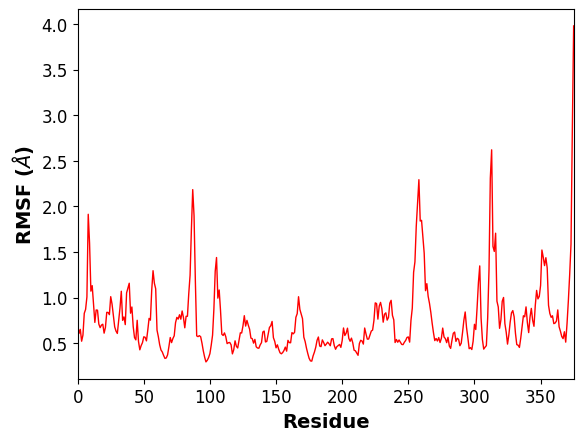

In [10]:
#@title Compute RMSF of protein's CA atoms

#@markdown **Provide output file names below:**
Output_name = 'rmsf_ca' #@param {type:"string"}


rmsf = pt.rmsf(traj_load, "@CA")
bfactor = pt.bfactors(traj_load, byres=True)

# Plotting:
plt.plot(rmsf[:,1], alpha=1.0, color = 'red', linewidth = 1.0)

plt.xlabel("Residue", fontsize = 14, fontweight = 'bold')
plt.ylabel("RMSF ($\AA$)", fontsize = 14, fontweight = 'bold')
plt.xticks(fontsize = 12)
plt.xlim(0, len(rmsf[:-1]))

#plt.xticks(np.arange(min(rmsf[:1]), max(rmsf[:1])))
plt.yticks(fontsize = 12)
plt.savefig(os.path.join(workDir, Output_name + ".png"), dpi=600, bbox_inches='tight')

raw_data=pd.DataFrame(rmsf)
raw_data.to_csv(os.path.join(workDir, Output_name + ".csv"))

In [12]:
#@title **Create a Covariance Matrix**
%%capture
import locale
def getpreferredencoding(do_setlocale = True):
    return "UTF-8"
locale.getpreferredencoding = getpreferredencoding

!echo 3 3 | gmx covar -f /content/SUFU_GLI3_prod1-1_nw.xtc -s /content/SUFU_GLI3_equil.pdb -o eigenval_all.xvg -v eigenvec_all.trr -l WT_covar.log -ascii WT_covar.dat -av average_all.pdb


'WT_DCCM.png'

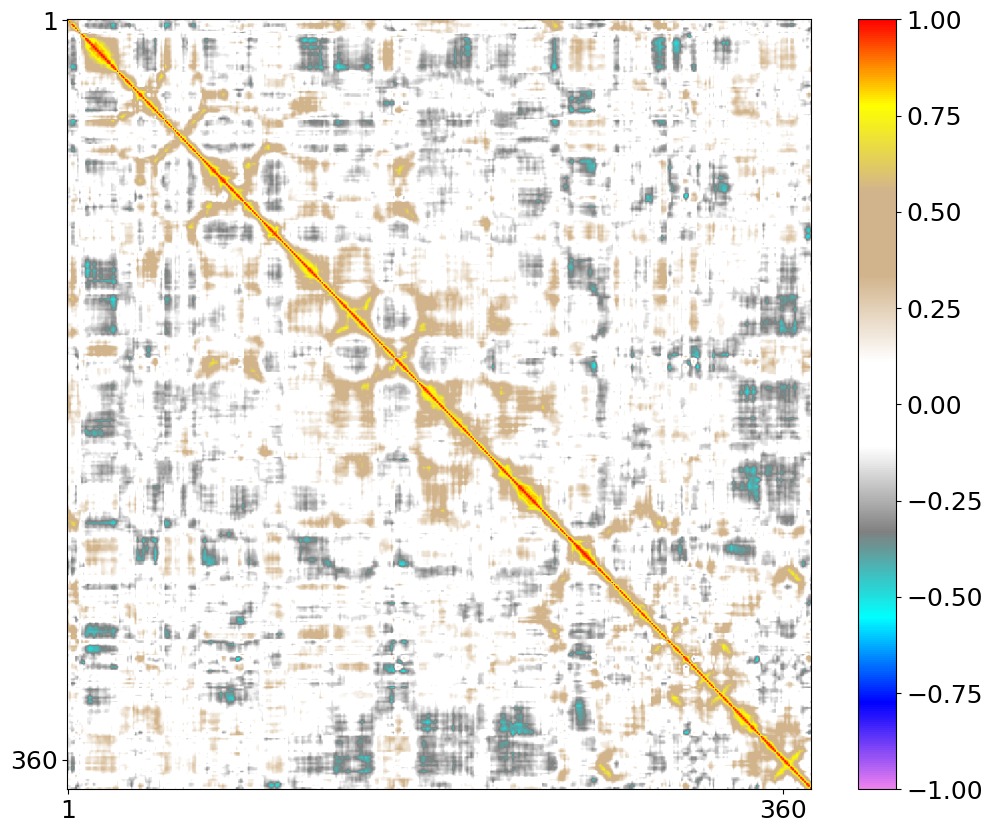

In [13]:
#@title **Generate a Dynamic Cross Correlation Map**

from matplotlib.colors import LinearSegmentedColormap

def DCCM_from_covarDat(covarDat, fast_read=False):

    if not isinstance(fast_read, bool):
        raise TypeError("'fast_read' = "+str(fast_read))
    if fast_read:
        covar = read_dat_file(covarDat).to_numpy()
    else:
        covar = pd.read_csv(covarDat, header=None, sep=" ").to_numpy()
    N = int(np.sqrt(covar.shape[0]/3))
    covar = covar.reshape(3*N, 3*N)
    covar = covar[::3,::3]+covar[1::3,1::3]+covar[2::3,2::3]
    corr = covar/covar.diagonal()**.5
    corr = (corr.T/covar.diagonal()**.5).T
    return corr

def plot_DCCM(mutant,ticks,labels):
    covarDat=mutant+"_covar.dat"
    corrM = DCCM_from_covarDat(covarDat, fast_read=False)
    plt.figure(figsize=(12,10))
    my_cmap = LinearSegmentedColormap.from_list(
            "iacovelli_cmap",
            colors=["violet", "blue", "cyan", "grey", "white", "white", "tan", "tan", "yellow", "red"],
            N=corrM.shape[0]
        )
    cbar=plt.colorbar(plt.imshow(corrM[1:,1:], aspect="auto", vmin=-1, vmax=1, cmap=my_cmap))
    #ticks = [i for i in range(0, corrM.shape[0]+1, 100)]
    plt.xticks(ticks,labels=labels,fontsize=18)
    plt.yticks(ticks,labels=labels, fontsize=18)
    cbar.ax.tick_params(labelsize=18)
    dccm_plot_png=mutant+"_DCCM.png"
    #plt.savefig("report/input/"+dccm_plot_png)
    return dccm_plot_png


plot_DCCM("WT",[0, 360],['1', '360'])

In [14]:
#@title **Let's now calculate the hydrogen bonds**

import parmed as pmd

amber = pmd.load_file('/content/SYS_nw.prmtop', '/content/SYS_nw.crd')
# Save a GROMACS topology and GRO file
amber.save('gromacs.top', overwrite=True)
amber.save('gromacs.gro',overwrite=True)
# Define the content of the ions.mdp file
mdp_content = """; ions.mdp - used as input into grompp to generate ions.tpr
; Parameters describing what to do, when to stop and what to save
integrator  = steep         ; Algorithm (steep = steepest descent minimization)
emtol       = 1000.0        ; Stop minimization when the maximum force < 1000.0 kJ/mol/nm
emstep      = 0.01          ; Minimization step size
nsteps      = 50000         ; Maximum number of (minimization) steps to perform

; Parameters describing how to find the neighbors of each atom and how to calculate the interactions
nstlist         = 1         ; Frequency to update the neighbor list and long range forces
cutoff-scheme   = Verlet    ; Buffered neighbor searching
ns_type         = grid      ; Method to determine neighbor list (simple, grid)
coulombtype     = cutoff    ; Treatment of long range electrostatic interactions
rcoulomb        = 1.0       ; Short-range electrostatic cut-off
rvdw            = 1.0       ; Short-range Van der Waals cut-off
pbc             = xyz       ; Periodic Boundary Conditions in all 3 dimensions
"""

# Write the content to the ions.mdp file
with open("gromacs.mdp", "w") as mdp_file:
    mdp_file.write(mdp_content)

              :-) GROMACS - gmx grompp, 2021.4-Ubuntu-2021.4-2 (-:

                            GROMACS is written by:
     Andrey Alekseenko              Emile Apol              Rossen Apostolov     
         Paul Bauer           Herman J.C. Berendsen           Par Bjelkmar       
       Christian Blau           Viacheslav Bolnykh             Kevin Boyd        
     Aldert van Buuren           Rudi van Drunen             Anton Feenstra      
    Gilles Gouaillardet             Alan Gray               Gerrit Groenhof      
       Anca Hamuraru            Vincent Hindriksen          M. Eric Irrgang      
      Aleksei Iupinov           Christoph Junghans             Joe Jordan        
    Dimitrios Karkoulis            Peter Kasson                Jiri Kraus        
      Carsten Kutzner              Per Larsson              Justin A. Lemkul     
       Viveca Lindahl            Magnus Lundborg             Erik Marklund       
        Pascal Merz             Pieter Meulenhoff            

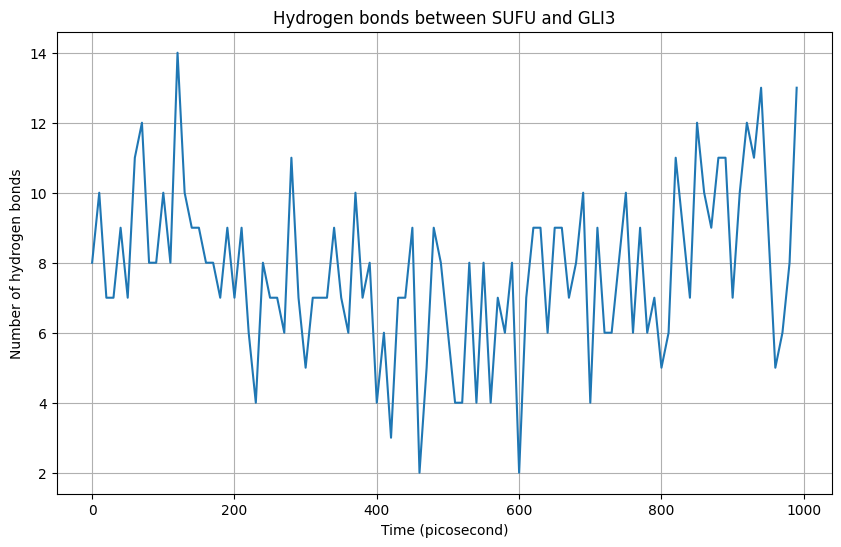

In [20]:
#@title **Plot the hydrogen bonds between SUFU and GLI3**

!gmx grompp -f gromacs.mdp -c /content/gromacs.gro -p gromacs.top -o gromacs.tpr -maxwarn 5
!echo  -e "r 1-8\nr 9-376\nq"| gmx make_ndx -f /content/gromacs.gro  -o index.ndx
!echo 14 15  | gmx hbond -f /content/SUFU_GLI3_prod1-1_nw.xtc -s /content/gromacs.tpr -n /content/index.ndx -num /content/hbond_num.xvg


file_path="/content/hbond_num.xvg"
# Loading the data into a pandas DataFrame
# Assuming that the columns are separated by whitespace
df = pd.read_csv(file_path, delim_whitespace=True, skiprows=25, header=None)

# Extracting the first and last columns
x = df.iloc[:, 0]  # First column
y = df.iloc[:, -1] # Last column

# Investigating the problematic lines in the file

problematic_lines = []

with open(file_path, 'r') as file:

    for i, line in enumerate(file):

        if not line.strip().startswith('#') and not line.strip().startswith('@'):

            fields = line.strip().split()

            if len(fields) != 3:  # Expecting 3 fields based on the error message

                problematic_lines.append((i, line.strip()))



# Displaying the first few problematic lines

problematic_lines[:10]

data = []

with open(file_path, 'r') as file:

    for line in file:

        if not line.strip().startswith('#') and not line.strip().startswith('@'):

            fields = line.strip().split()

            if len(fields) == 3:  # Expecting 3 fields based on previous observations

                try:

                    # Converting fields to floats and appending to the data list

                    data.append([float(field) for field in fields])

                except ValueError:

                    # Skip lines that cannot be converted to floats

                    continue



# Creating a DataFrame from the extracted data

df_manual = pd.DataFrame(data, columns=['Time', 'Column2', 'Value'])



# Plotting

plt.figure(figsize=(10, 6))

plt.plot(df_manual['Time'], df_manual['Value'])

plt.xlabel('Time (picosecond)')

plt.ylabel('Number of hydrogen bonds')

plt.title('Hydrogen bonds between SUFU and GLI3')

plt.grid(True)

plt.show()